# <title>Could the airport be the reason for the car crash? </title>


In [33]:
#Import necessary libraries
import requests
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns



In [2]:
#Get the API key
api_key_AL = "bf67c5a0-0554-4901-8877-7118756ac22b"




<h1>Get data about airports within a distance of 1000 kilometers from Sydney. </h1>

In [3]:
#set distance
distance = 1000
#request
response = requests.get(f'https://airlabs.co/api/v9/nearby?lat=-33.44&lng=151.8294&distance={distance}&api_key={api_key_AL}')
data = response.json()
df = data.get("response",[])
df = df.get("airports",[])
df = pd.DataFrame(df)

print(df)


                                    name iata_code icao_code    lat     lng  \
0                 Wyong Hospital Helipad      None      YXWY -33.26  151.48   
1                         Erina Heliport      None      YEHP -33.44  151.37   
2                    Warnervale Airfield      None      YWVA -33.24  151.43   
3                    Aeropelican Airport       BEO      YPEC -33.07  151.65   
4               Gosford Hospital Helipad      None      YXGS -33.42  151.34   
..                                   ...       ...       ...    ...     ...   
648  Northwest Regional Hospital Helipad      None      YBUI -41.05  145.88   
649                        Moura Airport      None      YMOU -24.61  149.99   
650                     Ingelara Airport      None      YING -25.00  148.33   
651                      Wynyard Airport       BWT      YWYY -41.00  145.73   
652                     Hamilton Airport       HLT      YHML -37.65  142.06   

    country_code  popularity  distance  
0         

In [4]:
#data crearance
df.drop(columns=["distance","country_code",'iata_code',"icao_code"])


,name,lat,lng,popularity
0,Wyong Hospital Helipad,-33.26,151.48,10
1,Erina Heliport,-33.44,151.37,10
2,Warnervale Airfield,-33.24,151.43,10
3,Aeropelican Airport,-33.07,151.65,1
4,Gosford Hospital Helipad,-33.42,151.34,10
...,...,...,...,...
648,Northwest Regional Hospital Helipad,-41.05,145.88,10
649,Moura Airport,-24.61,149.99,10
650,Ingelara Airport,-25.00,148.33,10
651,Wynyard Airport,-41.00,145.73,1000


In [6]:
fig = px.scatter_mapbox(df,
                        lat="lat",
                        lon="lng",
                        hover_name="name",
                        zoom=4)




fig.update_layout(mapbox_style="open-street-map")
fig.update_traces(marker= {"size": 20})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

empty_map = fig

fig.show()

<h3>We don't need non-popular airports and airports that are far from the New South Wales area.</h3>

In [7]:
df.drop(df[df["popularity"] < 2000].index, inplace=True)
df.drop(df[df["lat"] < -37].index, inplace=True)
df.drop(df[df["lat"] > -29].index, inplace=True)
df.drop(df[df["lng"] < 149].index, inplace=True)

fig = px.scatter_mapbox(df,
                        lat="lat",
                        lon="lng",
                        hover_name="name",
                       zoom = 5)




fig.update_layout(mapbox_style="open-street-map")
fig.update_traces(marker= {"size": 20})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

<h1 style = "background-color:Red;">Non-suitable airports example.</h1>
<h4>Some of the airports aren't within the city limits; or simply, we don't have any information about crashes in this city. It means that we cannot count them because the data will be incorrect.<h4>
<img src="Meribula Airport.png" alt="1i">
<img src="2.png" alt="2">



<h1>Getting information about crashes from the Excel file of crashes in New South Wales</h1>

In [8]:
crash_df = pd.read_excel(r'C:\Users\ilyas\Untitled Folder\nsw_road_crash_data_2018-2022_crash.xlsx')
print(crash_df.info())




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95873 entries, 0 to 95872
Data columns (total 50 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Crash ID                       95873 non-null  int64  
 1   Degree of crash                95873 non-null  object 
 2   Degree of crash - detailed     95873 non-null  object 
 3   Reporting year                 95873 non-null  int64  
 4   Year of crash                  95873 non-null  int64  
 5   Month of crash                 95873 non-null  object 
 6   Day of week of crash           95873 non-null  object 
 7   Two-hour intervals             95873 non-null  object 
 8   Street of crash                95873 non-null  object 
 9   Street type                    95873 non-null  object 
 10  Distance                       95873 non-null  int64  
 11  Direction                      95873 non-null  object 
 12  Identifying feature            95873 non-null 

<h1>Show the heatmap of crashes</h1>

In [9]:
fig_all_car_crash = fig
fig2 = px.density_mapbox(crash_df,lat="Latitude", lon='Longitude',zoom=8,radius=4)
fig_all_car_crash.add_trace(fig2.data[0])
fig_all_car_crash.show()

<h1>Choose the zones for the analysis.</h1>

In [26]:
airport_crashes = crash_df.copy()
airport_crashes = airport_crashes[(airport_crashes["Latitude"] <= -33.942606) &
                                  (airport_crashes["Latitude"] >= -33.947238) &
                                  (airport_crashes["Longitude"] >= 151.166920) &
                                  (airport_crashes["Longitude"] <= 151.190954)]

print(airport_crashes.info())

experimental_zone = crash_df.copy()
experimental_zone = experimental_zone[(experimental_zone["Latitude"] <= -33.9374) &
                                  (experimental_zone["Latitude"] >= -33.94101) &
                                  (experimental_zone["Longitude"] >= 151.0806) &
                                  (experimental_zone["Longitude"] <=  151.1162)]

print(experimental_zone.info())


<class 'pandas.core.frame.DataFrame'>
Index: 136 entries, 1745 to 95399
Data columns (total 50 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Crash ID                       136 non-null    int64  
 1   Degree of crash                136 non-null    object 
 2   Degree of crash - detailed     136 non-null    object 
 3   Reporting year                 136 non-null    int64  
 4   Year of crash                  136 non-null    int64  
 5   Month of crash                 136 non-null    object 
 6   Day of week of crash           136 non-null    object 
 7   Two-hour intervals             136 non-null    object 
 8   Street of crash                136 non-null    object 
 9   Street type                    136 non-null    object 
 10  Distance                       136 non-null    int64  
 11  Direction                      136 non-null    object 
 12  Identifying feature            136 non-null    obj

<h1 style="text-align: center;">  Zone close to the airport</h1>

In [14]:
fig_of_airport_crashes = go.Figure()
fig_heat_map_airport = px.density_mapbox(airport_crashes, lat="Latitude", lon="Longitude", radius=6)

fig_of_airport_crashes.update_layout(
    mapbox_style="open-street-map",
    mapbox=dict(zoom=15, center=dict(lat=-33.94592, lon=151.1790))
)
fig_of_airport_crashes.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig_of_airport_crashes.add_trace(fig_heat_map_airport.data[0])

fig_of_airport_crashes.show()

<h1 style="text-align: center;"> Experimental zone </h1>

In [13]:
fig_experimental_zone = go.Figure()
fig_heat_map_experimental_zone = px.density_mapbox(experimental_zone, lat="Latitude", lon="Longitude", radius=6)

fig_experimental_zone.update_layout(mapbox_style="open-street-map", mapbox=dict(zoom=14, center=dict(lat=-33.9399, lon=151.1009)))
fig_experimental_zone.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig_experimental_zone.add_trace(fig_heat_map_experimental_zone.data[0])

fig_experimental_zone.show()

<h1 style="text-align: center;"> Crash data clearance. </h1>

In [28]:
columns_to_keep = ['Degree of crash',
                   'Year of crash',
                   'Day of week of crash',
                   'Month of crash',
                   'Two-hour intervals',
                   'Surface condition',
                  'Weather',]
airport_crashes = airport_crashes.loc[:, columns_to_keep]
experimental_zone = experimental_zone.loc[:, columns_to_keep]

print(airport_crashes.info)
print(experimental_zone.info)

<bound method DataFrame.info of               Degree of crash  Year of crash Day of week of crash  \
1745                   Injury           2018              Tuesday   
1788                   Injury           2018               Monday   
1949   Non-casualty (towaway)           2018            Wednesday   
2263   Non-casualty (towaway)           2018               Monday   
4431   Non-casualty (towaway)           2018               Friday   
...                       ...            ...                  ...   
94024                  Injury           2022               Monday   
94236                  Injury           2022               Friday   
94345                  Injury           2022            Wednesday   
94641                  Injury           2022             Thursday   
95399                  Injury           2022             Thursday   

      Month of crash Two-hour intervals Surface condition   Weather  
1745         January      16:00 - 17:59               Dry      Fine  

<h1 style="text-align: center;"> Visualization and analysis </h1>

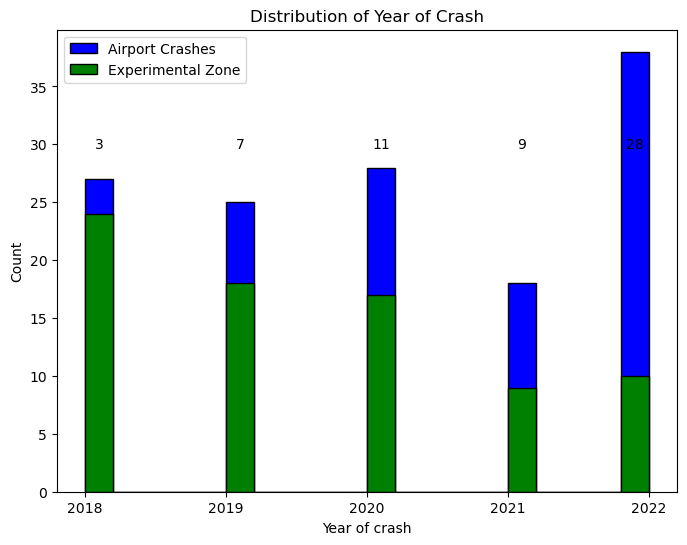

In [63]:
plt.figure(figsize=(8, 6))

# Plot the histograms
airport_hist, airport_bins, _ = plt.hist(airport_crashes['Year of crash'], bins=20, color='blue', label='Airport Crashes', edgecolor='black')
experimental_hist, experimental_bins, _ = plt.hist(experimental_zone['Year of crash'], bins=20, color='green', label='Experimental Zone', edgecolor='black')

# Calculate the bin centers
airport_bin_centers = 0.5 * (airport_bins[1:] + airport_bins[:-1])
experimental_bin_centers = 0.5 * (experimental_bins[1:] + experimental_bins[:-1])

# Calculate the differences between the histograms
differences = airport_hist - experimental_hist

# Set integer tick locations on the x-axis
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))

# Annotate the bars with the differences
for x, y in zip(airport_bin_centers, differences):
    if y!= 0:
        plt.text(x, 30, str(int(y)), ha='center', va='center')

plt.xlabel('Year of crash')
plt.ylabel('Count')
plt.title('Distribution of Year of Crash')
plt.legend()
plt.show()